In [ ]:
# the most basic CNN conv2 built in torch. 
# to be trained on leeds butterfly dataset
# 180523

In [11]:
pip install tensorflow --user

  Using cached tensorflow-2.12.0-cp39-cp39-win_amd64.whl (1.9 kB)
  Using cached tensorflow_intel-2.12.0-cp39-cp39-win_amd64.whl (272.8 MB)
  Using cached flatbuffers-23.5.26-py2.py3-none-any.whl (26 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl (65 kB)
  Using cached tensorflow_estimator-2.12.0-py2.py3-none-any.whl (440 kB)
  Using cached absl_py-1.4.0-py3-none-any.whl (126 kB)
  Using cached termcolor-2.3.0-py3-none-any.whl (6.9 kB)
  Using cached libclang-16.0.0-py2.py3-none-win_amd64.whl (24.4 MB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
  Using cached protobuf-4.23.3-cp39-cp39-win_amd64.whl (422 kB)
  Using cached gast-0.4.0-py3-none-any.whl (9.8 kB)
  Using cached jax-0.4.12-py3-none-any.whl
  Using cached keras-2.12.0-py2.py3-none-any.whl (1.7 MB)
  Using cached tensorflow_io_gcs_filesystem-0.31.0-cp39-cp39-win_amd64.whl (1.5 MB)
  Using cached tensorboard-2.12.3-py3-none-any.whl (5.6 MB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Usi

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-storage 1.31.0 requires google-auth<2.0dev,>=1.11.0, but you have google-auth 2.20.0 which is incompatible.
google-cloud-core 1.7.1 requires google-auth<2.0dev,>=1.24.0, but you have google-auth 2.20.0 which is incompatible.
google-api-core 1.25.1 requires google-auth<2.0dev,>=1.21.1, but you have google-auth 2.20.0 which is incompatible.


In [1]:
# imports

import torch
import torch.nn as nn
import numpy as np
from sklearn.model_selection import train_test_split
import random
import matplotlib.pyplot as plt
import wget


import os
import random
from torch.nn import functional
from zipfile import ZipFile
import cv2
import tensorflow as tf
from tensorflow import keras
import random
import copy
import seaborn as sns

2023-07-02 10:54:57.161704: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-07-02 10:54:57.188479: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-02 10:54:57.629874: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
!conda list

# packages in environment at C:\ProgramData\Anaconda3:
#
# Name                    Version                   Build  Channel
_anaconda_depends         2022.10                  py39_2  
_ipyw_jlab_nb_ext_conf    0.1.0            py39haa95532_0  
_tflow_select             2.2.0                     eigen  
absl-py                   0.6.1                    py36_0  
aiohttp                   3.8.1            py39h2bbff1b_1  
aiosignal                 1.2.0              pyhd3eb1b0_0  
alabaster                 0.7.12             pyhd3eb1b0_0  
anaconda                  custom                   py39_1  
anaconda-client           1.7.2                    pypi_0    pypi
anaconda-navigator        1.9.2                    pypi_0    pypi
anaconda-project          0.8.2                    pypi_0    pypi
anyio                     3.5.0            py39haa95532_0  
appdirs                   1.4.3                    pypi_0    pypi
argon2-cffi               21.3.0             pyhd3eb1b0_0  
argon2-cffi-

In [30]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


#  Load dataset

In [19]:
#!python -m wget https://zenodo.org/record/7559420/files/leedsbutterfly_dataset_v1.1.zip?download=1

'wget' is not recognized as an internal or external command,
operable program or batch file.


# Data Exploration

In [2]:
import os
import wget
import gzip
import numpy as np


# Define the URL and file names for the MNIST dataset
base_url = 'http://yann.lecun.com/exdb/mnist/'
train_images_url = base_url + 'train-images-idx3-ubyte.gz'
train_labels_url = base_url + 'train-labels-idx1-ubyte.gz'
test_images_url = base_url + 't10k-images-idx3-ubyte.gz'
test_labels_url = base_url + 't10k-labels-idx1-ubyte.gz'

# Define the directory to save the MNIST dataset
save_dir = r'MNIST-DATA' #DocumentsnotebooksMNIST-DATA

# Create the save directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# Download the MNIST dataset files
train_images_file = os.path.join(save_dir, 'train-images-idx3-ubyte.gz')
train_labels_file = os.path.join(save_dir, 'train-labels-idx1-ubyte.gz')
test_images_file = os.path.join(save_dir, 't10k-images-idx3-ubyte.gz')
test_labels_file = os.path.join(save_dir, 't10k-labels-idx1-ubyte.gz')
"""
wget.download(train_images_url, train_images_file)
wget.download(train_labels_url, train_labels_file)
wget.download(test_images_url, test_images_file)
wget.download(test_labels_url, test_labels_file)
"""
# Load the MNIST dataset
def load_mnist_images(filename):
    with gzip.open(filename, 'rb') as f:
        data = np.frombuffer(f.read(), np.uint8, offset=16)
    return data.reshape(-1, 28, 28)

def load_mnist_labels(filename):
    with gzip.open(filename, 'rb') as f:
        data = np.frombuffer(f.read(), np.uint8, offset=8)
    return data

train_images = load_mnist_images(train_images_file)
train_labels = load_mnist_labels(train_labels_file)
test_images = load_mnist_images(test_images_file)
test_labels = load_mnist_labels(test_labels_file)

# Print the shape of the training and testing data
print("Training data shape:", train_images.shape)  # (60000, 28, 28)
print("Training labels shape:", train_labels.shape)  # (60000,)
print("Testing data shape:", test_images.shape)  # (10000, 28, 28)
print("Testing labels shape:", test_labels.shape)  # (10000,)



Training data shape: (60000, 28, 28)
Training labels shape: (60000,)
Testing data shape: (10000, 28, 28)
Testing labels shape: (10000,)


## Split data

In [3]:
x_train = train_images
y_train = train_labels
x_test = test_images
y_test = test_labels

In [15]:
data = np.array(np.vstack([x_train, x_test]), dtype=np.float64) / 255.0
target = np.hstack([y_train, y_test])

In [10]:
flattened = data.reshape(data.shape[0], -1)
embedding = umap.UMAP(n_neighbors=10).fit_transform(flattened)

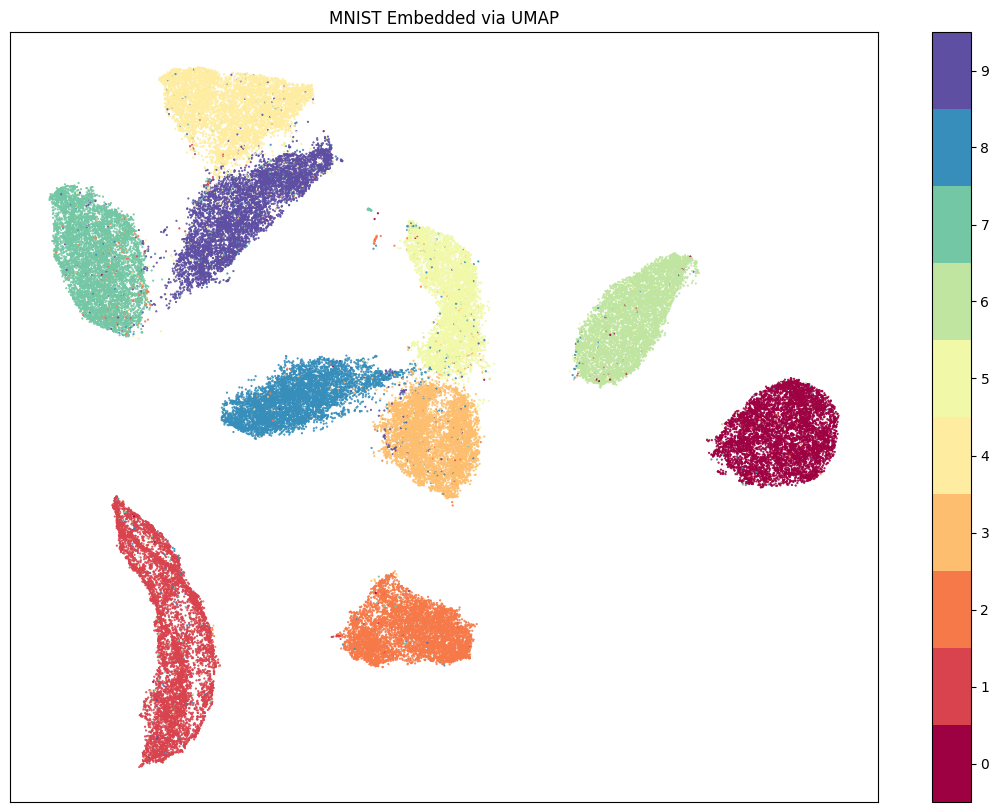

In [17]:
fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*embedding.T, s=0.3, c=target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
#cbar.set_ticklabels(classes)
plt.title('MNIST Embedded via UMAP');

In [4]:
# load dataset

random_seed = 42 #random.seed()

#(X_train, y_train), (X_test, y_test) = mnist.load_data()

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                  test_size = 0.1, train_size=0.9,
                                      random_state=random_seed, shuffle = True)

In [5]:
import umap

/its/home/nn268/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/its/home/nn268/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/its/home/nn268/.local/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarni

In [5]:
print('train: ', len(x_train),type(x_train), len(y_train), type(y_train))
print('val: ', len(x_val),type(x_val), len(y_val),type(y_val))
print('test: ', len(x_test),type(x_test), len(y_test),type(y_test))

train:  54000 <class 'numpy.ndarray'> 54000 <class 'numpy.ndarray'>
val:  6000 <class 'numpy.ndarray'> 6000 <class 'numpy.ndarray'>
test:  10000 <class 'numpy.ndarray'> 10000 <class 'numpy.ndarray'>


In [7]:
print(np.unique(y_train))

[0 1 2 3 4 5 6 7 8 9]


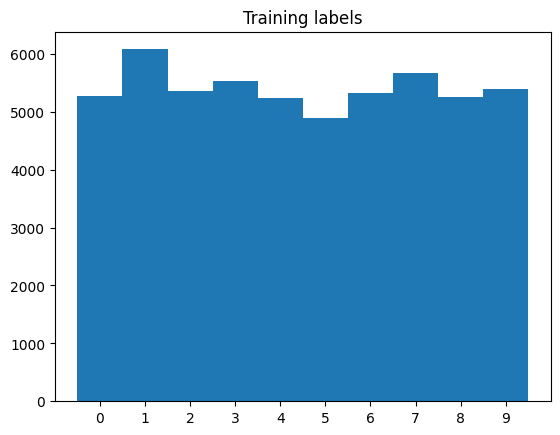

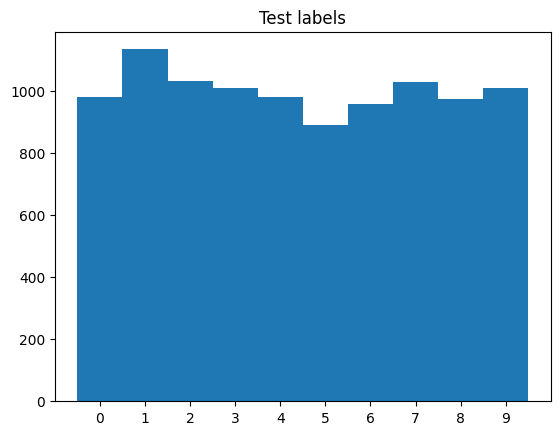

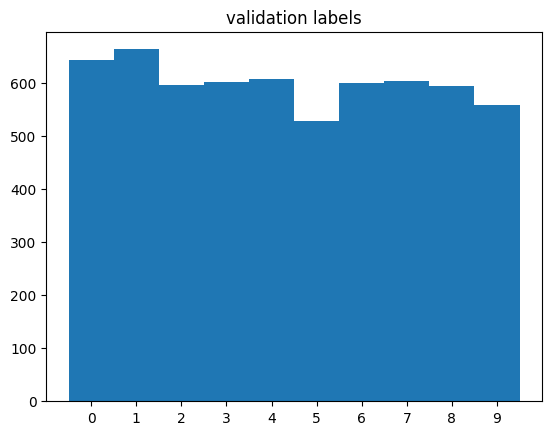

In [6]:
def label_dist_plot(data, label):
  plt.figure()
  _, _, _ = plt.hist(data, bins=[0, 1, 2,3,4,5,6,7,8,9,10], align='left')
  plt.xticks(np.unique(data))
  plt.xlim(left=min(np.unique(data))-1, right=max(np.unique(data))+1)
  plt.title(label)
  plt.show()


label_dist_plot(y_train, 'Training labels')
label_dist_plot(y_test, 'Test labels')
label_dist_plot(y_val, 'validation labels')

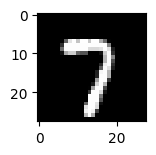

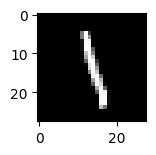

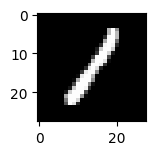

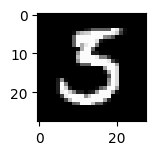

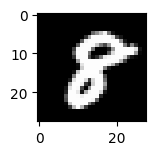

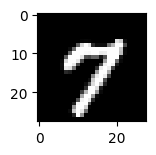

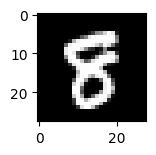

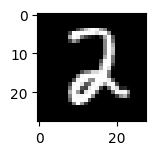

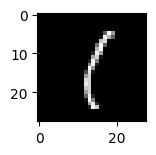

In [16]:
# look at imgs

for i in range(9):  
  plt.subplot(330 + 1 + i)
  plt.imshow(x_train[i], cmap=plt.get_cmap('gray'))
  plt.show()

In [5]:
device = "cuda:1" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")


Using cuda:1 device


In [6]:
def tensoring(input):

        img_tensor = torch.tensor(input)
        img_tensor = img_tensor.to(torch.float32)
        img_tensor = functional.normalize(img_tensor)
        img_tensor = torch.reshape(img_tensor, [1,1,28, 28])

        return img_tensor

def batch_tensoring(input):
  tensor = torch.tensor(input)
  tensor = tensor.to(torch.float32)
  tensor = functional.normalize(tensor)
  tensor = torch.reshape(tensor, [154000, 28, 28])

In [7]:
# Define model
class vgg16TorchNet(nn.Module):
    def __init__(self):
        super(vgg16TorchNet, self).__init__()
        self.flatten = nn.Flatten()

        self.conv_layers = nn.Sequential(  #
              nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=2), 
              nn.ReLU(), #inplace=True
              nn.Dropout(p=0.5),
              #nn.Conv2d(in_channels =32, out_channels=32, kernel_size=3),
              #nn.ReLU(),
              #nn.MaxPool2d(2, 2),
              nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=2), 
              nn.ReLU(), #inplace=True
              #nn.Conv2d(in_channels =64, out_channels=64, kernel_size=3),
              #nn.ReLU(),
              nn.MaxPool2d(2, 2),
              nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=2), 
              nn.ReLU(), #inplace=True
              #nn.Conv2d(in_channels =128, out_channels=128, kernel_size=3),
              #nn.ReLU(),
              nn.Conv2d(in_channels =128, out_channels=128, kernel_size=3),
              nn.ReLU(),
              nn.MaxPool2d(2,2),
              nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=2), 
              nn.ReLU(), #inplace=True
              #nn.Conv2d(in_channels =256, out_channels=256, kernel_size=3),
              #nn.ReLU(),
              nn.Conv2d(in_channels =256, out_channels=256, kernel_size=3),
              nn.ReLU(),
              nn.MaxPool2d(2,2),
              #nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=2), 
              #nn.ReLU(), #inplace=True
              #nn.Conv2d(in_channels =512, out_channels=512, kernel_size=3),
              #nn.ReLU(),
              #nn.Conv2d(in_channels =512, out_channels=512, kernel_size=3),
              #nn.ReLU(),
              #nn.MaxPool2d(2,2),
              nn.Dropout(p=0.5),
          )
        
        self.linear_1 = nn.Sequential(    #1x4096 and 512x100)
            nn.Linear(4096, 100), 
            nn.ReLU(),
            nn.Linear(100,100),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(100,10),
            nn.Softmax(), 
  
        )

    def forward(self, x):
      #forward method. opposition to backward pass
      #print(x.shape)
      x= self.conv_layers(x)
      x = x.flatten()
      x = x.squeeze()
      print('conv x', x.shape)
      x = self.linear_1(x)
      #print('lin1 x', x)
      return x
        



#conv1d() received an invalid combination of arguments - got (numpy.ndarray, Parameter, Parameter, tuple, tuple, tuple, int), but expected one of:
 #* (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups
     

In [13]:
#1
model = vgg16TorchNet()
print(model)

vgg16TorchNet(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (conv_layers): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (7): ReLU()
    (8): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
    (9): ReLU()
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (12): ReLU()
    (13): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
    (14): ReLU()
    (15): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (16): Dropout(p=0.5, inplace=False)
  )
  (linear_1): Sequential(
    (0): Linear(in_feat

In [32]:
# 1e-6_MSE_Adam
#Loss 
learning_rate = 1e-6
loss_fn = nn.MSELoss()   # nn.CrossEntropyLoss() #mean2 error. #nn.CrossEntropyLoss() #normalising, probability
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)

In [8]:
# train
def train_loop(model, x_train, y_train, epoch, optimizer, loss_fn):
  model = model
  x_train = x_train
  y_train = y_train


  model.train()

  predict_list = []

  total_count = 0
  num_correct = 0
  current_loss = 0
  total_samples = len(x_train)
  for idx, img in enumerate(x_train):
      tense = tensoring(img)
      
      prediction = model.forward(tense)
      #print(prediction.shape)
      #print('predict',prediction, 'predict')
      #print('max', prediction.argmax())
      
      num_classes = 10
      one_hot = np.zeros(num_classes)
      one_hot[y_train[idx]] = 1
      label = torch.tensor(one_hot)
      label = label.to(torch.float32)

      loss = loss_fn(prediction, label)
      predict_list.append(prediction.argmax())

      

      #print('\n ---------------------------------------------------------------')
      print('             Epoch: ', epoch, '  Sample: ', idx)

      if prediction.argmax() == label.argmax():
          print(f'\n ########################### HIT ########################### -- {idx} / {total_samples} \n')
          num_correct +=1
      #else:
        #print('\n ########################### MISS ########################### \n')
          
      total_count+=1

      #print('Prediction: ', prediction.argmax())
      #print('Label: ',label.argmax())
      #print('full_label', full_label[idx])
      #print()
      #print('Loss: ', loss.item())
      #print()
      print('---------------------------------------------------------------')
      #print(" |||| ||||| ||||| ||||| ||||| ||||| |||| |||| ||||| |||| |||| ")

      current_loss += loss.item()
      
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      

  return current_loss, predict_list, num_correct, model, optimizer


    


In [9]:
# validation loop

def validation_loop(model, x_val, y_val, epoch, loss_fn):
  model = model
  x_val = x_val
  y_val = y_val

  model.eval()

  predict_list = []
  
  total_count = 0
  num_correct = 0
  current_loss = 0
  total_samples = len(x_train)
  #print(np.array(x_val).shape)
    
  for idx, img in enumerate(x_val):
      tense = tensoring(img)
      
      prediction = model.forward(tense)
      #print(prediction.shape)

      num_classes = 10
      one_hot = np.zeros(num_classes)
      one_hot[y_val[idx]] = 1
      label = torch.tensor(one_hot)
      label = label.to(torch.float32)

      loss = loss_fn(prediction, label)
      
      predict_list.append(prediction.argmax())

      

      #print('\n ---------------------------------------------------------------')
      print('             Epoch: ', epoch, '  Sample: ', idx)

      if prediction.argmax() == label.argmax():
          print(f'\n ########################### HIT ########################### -- {idx} / {total_samples} \n')
          num_correct +=1
      #else:
        #print('\n ########################### MISS ########################### \n')
          
      total_count+=1

      #print('Prediction: ', prediction.argmax())
      #print('Label: ',label.argmax())
      #print('full_label', full_label[idx])
      #print()
      #print('Loss: ', loss.item())
      #print()
      print('---------------------------------------------------------------')
      #print(" |||| ||||| ||||| ||||| ||||| ||||| |||| |||| ||||| |||| |||| ")

      current_loss += loss.item()


  return current_loss, predict_list, num_correct


    


# REFRESHING

In [35]:

t_loss_list = []
t_predict_list =[]
t_accuracy_list = []

v_loss_list = []
v_predict_list =[]
v_accuracy_list = []

total_epochs = 0


save_dict = {'Run' : 'Butterfly Run For Val AND Test',
            'Current_Epoch': 0}

dict_keys(['Run', 'epochCount'])


In [12]:
"""# load pretrained model for more training or graphs
import pickle


load_epoch= 80
#butterfly_Simple_3_layer_Antnet_Epoch_250523_80_1e-05_ReLU_2linear

with open(f'C:\\Users\\nn268\\Documents\\antnet_model_code\\pickles\\300523\\butterfly_Simple_3_layer_Antnet_Epoch_250523_{load_epoch}_1e-05_ReLU_2linear.pkl', 'rb') as f:
    save_dict = pickle.load(f)

# Access dictionary elements
run_name = save_dict['Run'] 
total_epochs = save_dict['Current Epoch']
model_state_dict = save_dict['model.state_dict']
training_samples = save_dict['training_samples'] 
validation_samples = save_dict['validation_samples']

t_loss_list = save_dict['t_loss_list'] 
t_predict_list = save_dict['t_predict_list']
t_accuracy_list = save_dict['t_accuracy_list']

v_loss_list = save_dict['v_loss_list']
v_predict_list = save_dict['v_predict_list']  
v_accuracy_list = save_dict['v_accuracy_list']

# Load model state 
model.load_state_dict(model_state_dict) """

<All keys matched successfully>

# TRAIN MODEL

In [47]:
import pickle
from IPython.display import clear_output
# this is NOT the val loop
epochs = 7

#total_epochs = save_dict['Current_Epoch']
total_epochs=1
full_label = y_train

date ='220623'
save_location = r'/its/home/nn268/AntQueen/Saves/'

for epoch in range(epochs):
  print('EPOCH: ', epoch)
  print('----------------------')
  print(' \n                  TRAINING... \n')
  print('----------------------')
  train_loss, train_predict_loss, train_num_correct, model, optimizer = train_loop(model, x_train, y_train, epoch, optimizer, loss_fn)
  t_loss_list.append(train_loss)
  t_predict_list.append(train_predict_loss)
  t_accuracy_list.append(train_num_correct / len(y_train))


  print('----------------------')
  print(' \n                  VALIDATION... \n')
  print('----------------------')
  val_loss, val_predict_loss, val_num_correct = validation_loop(model, x_val, y_val, epoch, loss_fn)
  v_loss_list.append(val_loss)
  v_predict_list.append(val_predict_loss)
  v_accuracy_list.append(val_num_correct/ len(y_val))


  ##### Saving
    
  ## For saving purposes epoch should be total epoch, whereas currently it is current epoch
    
  total_epochs += 1 ### Total epochs is from a previous save

    
  save_dict['Current Epoch'] = total_epochs
  save_dict['model.state_dict'] = model.state_dict()
  save_dict['training_samples'] = len(x_train)
  save_dict['validation_samples'] = len(x_val)
  save_dict['t_loss_list'] = t_loss_list
  save_dict['t_predict_list'] = t_predict_list
  save_dict['t_accuracy_list'] = t_accuracy_list
  save_dict['v_loss_list'] = v_loss_list
  save_dict['v_predict_list'] = v_predict_list
  save_dict['v_accuracy_list'] = v_accuracy_list
  #save_dict['epochCount']+=1 Now using current_epoch above
    
  #date = '200623'
  #version ='ReLU_2linear0_crossentropy'
  

  with open(save_location+f'vgg16_mnist_Epoch_epoch{epoch}_{date}.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
    
    
  
  clear_output()
    
    
    
#total_epochs+= epochs

## Testing

In [49]:

model.eval()

test_predict_list = []

total_count = 0
num_correct = 0
current_loss = 0
#print(np.array(x_val).shape)

for idx, img in enumerate(x_test):
  tense = tensoring(img)

  prediction = model.forward(tense)
  #print(prediction.shape)


  num_classes = 10
  one_hot = np.zeros(num_classes)
  one_hot[y_test[idx]] = 1


  label = torch.tensor(one_hot)
  #print('label', label)
  label = label.to(torch.float32)

  loss = loss_fn(prediction, label)

  test_predict_list.append(prediction.argmax())



  print('\n ---------------------------------------------------------------')
  print('             Epoch: ', epoch, '  Sample: ', idx)

  if prediction.argmax() == label.argmax():
      print('\n ########################### HIT ########################### \n')
      num_correct +=1
  else:
    print('\n ########################### MISS ########################### \n')

  total_count+=1

  print('Prediction: ', prediction.argmax())
  print('Label: ',label.argmax())
  #print('full_label', full_label[idx])
  #print()
  #print('Loss: ', loss.item())
  #print()
  print('---------------------------------------------------------------')
  #print(" |||| ||||| ||||| ||||| ||||| ||||| |||| |||| ||||| |||| |||| ")

  current_loss += loss.item()
    
print(" |||| ||||| ||||| ||||| ||||| ||||| |||| |||| ||||| |||| |||| ")
print('\n')
print('Testing Output')
print('\n')
print(" |||| ||||| ||||| ||||| ||||| ||||| |||| |||| ||||| |||| |||| ")
print('\n')

print('Correct Results: ', num_correct)
print('Total QuestionsL ', total_count)
print('Testing Accuracy: ', 100 * (num_correct / total_count), ' % ')


conv x torch.Size([4096])

 ---------------------------------------------------------------
             Epoch:  6   Sample:  0

 ########################### HIT ########################### 

Prediction:  tensor(7)
Label:  tensor(7)
---------------------------------------------------------------
conv x torch.Size([4096])

 ---------------------------------------------------------------
             Epoch:  6   Sample:  1

 ########################### HIT ########################### 

Prediction:  tensor(2)
Label:  tensor(2)
---------------------------------------------------------------
conv x torch.Size([4096])

 ---------------------------------------------------------------
             Epoch:  6   Sample:  2

 ########################### HIT ########################### 

Prediction:  tensor(1)
Label:  tensor(1)
---------------------------------------------------------------
conv x torch.Size([4096])

 ---------------------------------------------------------------
             Epoc

In [46]:


"""
save_location = r'/its/home/nn268/AntQueen/Saves/'

with open(save_location+f'vgg16_mnist_Epoch_epoch{epoch}_{date}.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
"""

In [45]:
#!pwd

/its/home/nn268/AntQueen


In [129]:
print(save_dict)

{'Run': 'Butterfly 20 epochbacktomodelthatworked_CrossEntropy_schholcompREF', 'Current_Epoch': 0, 'Current Epoch': 30, 'model.state_dict': OrderedDict([('conv_layers.0.weight', tensor([[[[ 8.9578e-38,  3.2513e-37,  2.2388e-37],
          [-5.6440e-37, -5.0037e-37, -4.7922e-37],
          [-1.1402e-37, -2.8062e-37, -1.1852e-37]],

         [[-5.9197e-37, -4.7972e-37, -3.3743e-37],
          [-9.5533e-39, -1.3844e-37, -2.6557e-37],
          [-1.6347e-37, -5.0405e-37, -6.1753e-37]],

         [[ 6.8590e-39, -6.7514e-38, -7.7026e-38],
          [-3.2942e-37, -4.2064e-37, -3.8732e-37],
          [-1.7335e-37, -2.3566e-37, -5.4115e-37]]],


        [[[-1.7928e-37, -2.1971e-37, -2.2934e-37],
          [-2.3235e-37, -2.5258e-37, -2.1497e-37],
          [-2.8768e-37,  2.5685e-37, -2.7444e-37]],

         [[-2.3804e-37,  2.4660e-37, -2.2848e-37],
          [ 2.4608e-37, -2.5045e-37, -2.4296e-37],
          [-2.1789e-37,  2.2919e-37, -2.2152e-37]],

         [[ 2.3978e-37, -2.6381e-37, -2.3925e-

# Hyper-Parameter Sweep

In [8]:
learning_rate =0.1
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
shed =torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)
print(shed)

NameError: name 'model' is not defined

In [ ]:
# Hyperparameter sweep

##### remember to make the pickle folder before running!
##### adapt train loopppp

#290623 sweep to test learningrate schedulers

# 1e-6_MSE_Adam
#Loss 

save_location = r'/its/home/nn268/AntQueen/Saves/hpSweep/'

learning_rate = 1e-6
loss_fn = nn.MSELoss()   # nn.CrossEntropyLoss() #mean2 error. #nn.CrossEntropyLoss() #normalising, probability
#optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)

import pickle
from IPython.display import clear_output
full_label = y_train

def hyperparameter_sweep():
    # a function to loop through hyperparameters for finding the best ones for certain architecture
    
    epochs = 100
    
    lr_list = [0.1, 0.05, 0.01]#,1e-4, 1e-6
    optimiser_list = ['Adam']
    lossfn_list = [torch.nn.MSELoss()]#, torch.nn.NLLLoss(), torch.nn.CrossEntropyLoss()]
    scheduler_list = ['ReduceLROnPlateau',
                      'CosineAnnealingLR']
    
    best_optim = None
    best_lossfn = None
    best_lr = 0
    best_valaccuracy = 0
    best_epoch = 0
    
    for learning_rate in lr_list:
        for optim in optimiser_list:
            for sched in scheduler_list:
                for loss_fn in lossfn_list:

                    model = vgg16TorchNet() #model architecture
                    init_lr = learning_rate
                    if optim =='Adam':
                        optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
                    elif optim == 'SGD':
                        optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
                        
                    if sched == 'ReduceLROnPlateau':
                        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10, verbose=True)
                    elif sched == 'CosineAnnealingLR':
                        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6, T_0=50)
                    
                    t_loss_list = []
                    t_predict_list =[]
                    t_accuracy_list = []

                    v_loss_list = []
                    v_predict_list =[]
                    v_accuracy_list = []

                    total_epochs = 0
                    title = f'vgg16architcture_HyperParameterSweep_{str(learning_rate)}_{str(optimizer)}_{str(loss_fn)}schholcompREF'
                    save_dict = {'Run' : title,
                                'Current_Epoch': 0}

                    print('\n')
                    print('LR: ', learning_rate)
                    print('optimiser: ', optim)
                    print('loss fn: ', loss_fn)

                    for epoch in range(epochs):
                      print('EPOCH: ', epoch)
                      print('----------------------')
                      print(' \n                  TRAINING... \n')
                      print('----------------------')
                      train_loss, train_predict_loss, train_num_correct, model, optimizer = train_loop(model, x_train, y_train, epoch, optimizer, loss_fn)
                      t_loss_list.append(train_loss)
                      t_predict_list.append(train_predict_loss)
                      t_accuracy_list.append(train_num_correct / len(y_train))


                      print('----------------------')
                      print(' \n                  VALIDATION... \n')
                      print('----------------------')
                      val_loss, val_predict_loss, val_num_correct = validation_loop(model, x_val, y_val, epoch, loss_fn)
                      v_loss_list.append(val_loss)
                      v_predict_list.append(val_predict_loss)
                      v_accuracy_list.append(val_num_correct/ len(y_val))
                    
                      if scheduler == 'ReduceLROnPlateau':
                            scheduler.step(val_loss)  # Pass val_loss
                      elif scheduler == 'CosineAnnealingLR':
                            scheduler.step()

                      if v_accuracy_list[-1] > best_valaccuracy:
                            best_valaccuracy = v_accuracy_list[-1]
                            best_optim = optimizer
                            best_lossfn = loss_fn
                            best_lr = learning_rate
                            best_epoch = epoch
                            best_model = copy.deepcopy(model)

                      total_epochs += 1 ### Total epochs is from a previous save
                      clear_output()


                save_dict['Current Epoch'] = total_epochs
                save_dict['model.state_dict'] = model.state_dict()
                save_dict['training_samples'] = len(x_train)
                save_dict['validation_samples'] = len(x_val)
                save_dict['t_loss_list'] = t_loss_list
                save_dict['t_predict_list'] = t_predict_list
                save_dict['t_accuracy_list'] = t_accuracy_list
                save_dict['v_loss_list'] = v_loss_list
                save_dict['v_predict_list'] = v_predict_list
                save_dict['v_accuracy_list'] = v_accuracy_list
                #save_dict['epochCount']+=1 Now using current_epoch above

                date = '290623'
                final_train_acc = round(t_accuracy_list[-1],3)
                final_val_acc = round(v_accuracy_list[-1],3)
                version =f'MNIST_epoch_{total_epochs}_init_lr{init_lr}_endlr{str(learning_rate)}_{optim}_{str(loss_fn)}_Acc_{final_train_acc}_{final_val_acc}'
                with open(f'{save_location} +vgg16_mnist_Epoch_{date}_{version}.pkl', 'wb') as f:
                    pickle.dump(save_dict, f) #hpSweep



                      
                     

                      
    print(best_optim, best_lossfn, best_lr, best_valaccuracy, best_epoch)
    return best_optim, best_lossfn, best_lr, best_valaccuracy, best_epoch, model, v_loss_list, t_loss_list, v_accuracy_list, t_accuracy_list



best_optim, best_lossfn, best_lr, best_valaccuracy, best_epoch, model = hyperparameter_sweep()

EPOCH:  9
----------------------
 
                  TRAINING... 

----------------------
conv x torch.Size([4096])
             Epoch:  9   Sample:  0

 ########################### HIT ########################### -- 0 / 54000 

---------------------------------------------------------------
conv x torch.Size([4096])
             Epoch:  9   Sample:  1
---------------------------------------------------------------
conv x torch.Size([4096])
             Epoch:  9   Sample:  2
---------------------------------------------------------------
conv x torch.Size([4096])
             Epoch:  9   Sample:  3
---------------------------------------------------------------
conv x torch.Size([4096])
             Epoch:  9   Sample:  4
---------------------------------------------------------------
conv x torch.Size([4096])
             Epoch:  9   Sample:  5
---------------------------------------------------------------
conv x torch.Size([4096])
             Epoch:  9   Sample:  6
---------------

In [60]:
print('----------------------')
print(' \n                  VALIDATION... \n')
print('----------------------')
val_loss, val_predict_loss, val_num_correct = validation_loop(model, x_val, y_val, epoch, loss_fn)
v_loss_list.append(val_loss)
v_predict_list.append(val_predict_loss)
v_accuracy_list.append(val_num_correct/ len(y_val))
"""
if v_accuracy_list[-1] > best_valaccuracy:
    best_valaccuracy = v_accuracy_list[-1]
    best_optim = optimizer
    best_lossfn = loss_fn
    best_lr = learning_rate
    best_epoch = epoch
"""


----------------------
 
                  VALIDATION... 

----------------------
(6000, 28, 28)
conv x torch.Size([512])
torch.Size([10])

 ---------------------------------------------------------------
             Epoch:  0   Sample:  0

 ########################### MISS ########################### 

Prediction:  tensor([0.0945, 0.1050, 0.0950, 0.1049, 0.0929, 0.1084, 0.1003, 0.1036, 0.1017,
        0.0938], grad_fn=<SoftmaxBackward>) ARRRGGGG tensor(5)
Label:  tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0.])
full_label 7

Loss:  0.0893152505159378

---------------------------------------------------------------
 |||| ||||| ||||| ||||| ||||| ||||| |||| |||| ||||| |||| |||| 
conv x torch.Size([512])
torch.Size([10])

 ---------------------------------------------------------------
             Epoch:  0   Sample:  1

 ########################### MISS ########################### 

Prediction:  tensor([0.0945, 0.1050, 0.0950, 0.1049, 0.0929, 0.1084, 0.1003, 0.1036, 0.1017,
        0.0

NameError: name 'best_valaccuracy' is not defined

In [62]:
total_epochs += 1 ### Total epochs is from a previous save


save_dict['Current Epoch'] = total_epochs
save_dict['model.state_dict'] = model.state_dict()
save_dict['training_samples'] = len(x_train)
save_dict['validation_samples'] = len(x_val)
save_dict['t_loss_list'] = t_loss_list
save_dict['t_predict_list'] = t_predict_list
save_dict['t_accuracy_list'] = t_accuracy_list
save_dict['v_loss_list'] = v_loss_list
save_dict['v_predict_list'] = v_predict_list
save_dict['v_accuracy_list'] = v_accuracy_list
#save_dict['epochCount']+=1 Now using current_epoch above

date = '010623'
version =f'Butterfly{total_epochs}epoch_{str(learning_rate)}_Adam_{str(loss_fn)}schholcompREF'
with open(f'D:\\PHD\\antNet\\pickles\\140623_mnist\\vgg16_mnist_Epoch_{date}_{version}.pkl', 'wb') as f:
    pickle.dump(save_dict, f)

In [ ]:
optim = 'Adam'
version =f'Butterfly{total_epochs}epoch_{str(learning_rate)}lr_{optim}optim_{str(loss_fn)}lossfn_schholcompREF'

print(version)

In [15]:
# load saved pickle model for graphs or further training

import pickle

model = vgg16TorchNet()
load_epoch= 1
#MNIST_Simple_3_layer_Antnet_Epoch_250523_24_0.05_ReLU_2linear.pkl
save_location = r'/its/home/nn268/AntQueen/Saves/'
with open(save_location+f'vgg16_mnist_Epoch_epoch6_220623.pkl', 'rb') as f:
    save_dict = pickle.load(f)

# Access dictionary elements
run_name = save_dict['Run'] 
total_epochs = save_dict['Current Epoch']
model_state_dict = save_dict['model.state_dict']
training_samples = save_dict['training_samples'] 
validation_samples = save_dict['validation_samples']

t_loss_list = save_dict['t_loss_list'] 
t_predict_list = save_dict['t_predict_list']
t_accuracy_list = save_dict['t_accuracy_list']

v_loss_list = save_dict['v_loss_list']
v_predict_list = save_dict['v_predict_list']  
v_accuracy_list = save_dict['v_accuracy_list']

# Load model state 
model.load_state_dict(model_state_dict) 

<All keys matched successfully>

In [ ]:
print(save_dict)

NameError: name 'date' is not defined

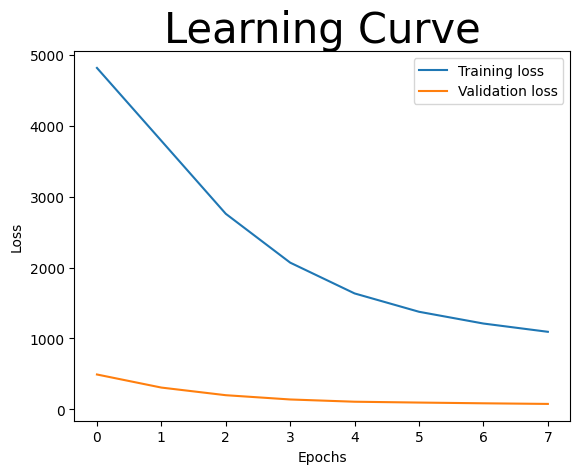

In [16]:
# learning curve
# Import date class from datetime module
import datetime
execution = datetime.datetime.now()
import pylab

def learning_curve(v_loss_list, t_loss_list):
  plt.title(label="Learning Curve", fontsize =30)
  plt.plot(range(len(t_loss_list)), t_loss_list, label ='Training loss')
  plt.plot(range(len(v_loss_list)), v_loss_list, label='Validation loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  #plt.yscale("log")
  plt.legend()
  pylab.savefig(save_location+f'\MNIST_1e-6_MSE_Adam_10e7_learningCuve_{date}.png')
  plt.show()
  # save figs
  
 
def accuracy_curve(v_accuracy_list, t_accuracy_list):
  plt.title(label="Accuracy Curve", fontsize =30)
  plt.plot(range(len(t_accuracy_list)), t_accuracy_list, label ='Training accuracy')
  plt.plot(range(len(v_accuracy_list)), v_accuracy_list, label='Validation accuracy')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  pylab.savefig(save_location+f'\MNIST_1e-6_MSE_Adam_10e7_accuracyCuve_{date}.png')
  plt.show()
  

learning_curve(v_loss_list, t_loss_list)

accuracy_curve(v_accuracy_list, t_accuracy_list)

In [25]:
print(len(t_accuracy_list))

10


In [25]:
print(r(v_predict_list[0][0]))

NameError: name 'r' is not defined

In [131]:
print(v_predict_list)

[[tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5)], [tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor(5), tensor

In [64]:
# Confusion Matrix
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

epoch_in_question = -1

"""print("\n Training Confusion matrix:")
train_epoch_matrix = confusion_matrix(y_train, t_predict_list[epoch_in_question])
disp = ConfusionMatrixDisplay(train_epoch_matrix, display_labels=[0, 1, 2])
disp.plot()
plt.title('Training Confusion Matrix')
plt.show()
"""


print("\n Val Confusion matrix:")
val_epoch_matrix = confusion_matrix(y_val, v_predict_list[epoch_in_question])
disp = ConfusionMatrixDisplay(val_epoch_matrix, display_labels=[0, 1, 2,3,4,5,6,7,8,9])
disp.plot()
plt.show()


 Val Confusion matrix:


IndexError: list index out of range

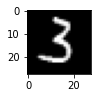

conv x torch.Size([512])
 
 Prediction:   tensor(3)

 LabeL:  tensor(3)


In [45]:
# seeing if validation works
i = 144
test_im = x_val[i]
test_y = y_val[i]
  
plt.subplot(330 + 1 + 2)
plt.imshow(test_im, cmap=plt.get_cmap('gray'))
plt.show()



tense_im = tensoring(test_im)
prediction_test = model.forward(tense_im)


num_classes = 10
one_hot = np.zeros(num_classes)
one_hot[test_y] = 1


label = torch.tensor(one_hot)
label = label.to(torch.float32)

print(' \n Prediction:  ',prediction_test.argmax())
print('\n LabeL: ',label.argmax())